In [1]:
import pandas as pd
import numpy as np
import re
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from fastai.text.all import *
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
from gensim import models
from keras.layers import Dense, Dropout, Reshape, Flatten, concatenate, Input, Conv1D, GlobalMaxPooling1D, Embedding
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Model
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.express as px
from plotly.subplots import make_subplots
init_notebook_mode(connected=True)
import datetime
import warnings
warnings.filterwarnings("ignore")

[nltk_data] Downloading package stopwords to /home/madao/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /home/madao/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /home/madao/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
from keras.initializers import glorot_uniform
import tensorflow as tf

In [3]:
#Reading the model from JSON file
with open('model.json', 'r') as json_file:
    json_savedModel= json_file.read()
#load the model architecture 
model_j = tf.keras.models.model_from_json(json_savedModel)
model_j.load_weights('model.h5')
model_j.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 65)]         0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 65, 300)      6381300     input_1[0][0]                    
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 64, 200)      120200      embedding[0][0]                  
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 63, 200)      180200      embedding[0][0]                  
______________________________________________________________________________________________

In [4]:
# Use fastai to handle text preprocessing and tokenization
from fastai.text.all import *
path = Path(f'{os.getcwd()}/../datasets/')

In [5]:
tweets_covid_all_vaccination = pd.read_csv(path/'tweets_covid_all_vaccination.csv')
tweets_extraction = pd.read_csv(path/'tweets_extraction.csv')

In [6]:
# Remove Emojis Helper
def remove_emojis(str):
    return str.encode('ascii', 'ignore').decode('ascii')

# Remove URLs, Hashtags, handles, and Emojis
def remove(ts, idx='text'):
    ts['orig_text'] = ts[idx]
    ts[idx] = ts[idx].apply(lambda x:re.sub('@[^\s]+','',x))
    ts[idx] = ts[idx].apply(lambda x:re.sub(r"http\S+", "", x))
    ts[idx] = ts[idx].apply(remove_emojis)
    ts[idx] = ts[idx].apply(lambda x:re.sub(r'\B#\S+','',x))
    return ts[ts[idx]!='']

tweets_covid_all_vaccination['sentiment'] = np.nan
tweets_covid_all_vaccination = remove(tweets_covid_all_vaccination)
tweets_extraction = tweets_extraction[['old_text', 'new_sentiment']].rename(columns={'old_text':'text', 'new_sentiment':'sentiment'})
tweets_extraction = remove(tweets_extraction)
tweets_merge = tweets_extraction[['text', 'sentiment']].append(tweets_covid_all_vaccination[['text', 'sentiment']])
tweets = tweets_merge.dropna(subset=['sentiment'])

In [7]:
def get_average_word2vec(tokens_list, vector, generate_missing=False, k=300):
    if len(tokens_list)<1:
        return np.zeros(k)
    if generate_missing:
        vectorized = [vector[word] if word in vector else np.random.rand(k) for word in tokens_list]
    else:
        vectorized = [vector[word] if word in vector else np.zeros(k) for word in tokens_list]
    length = len(vectorized)
    summed = np.sum(vectorized, axis=0)
    averaged = np.divide(summed, length)
    return averaged

def get_word2vec_embeddings(vectors, clean_comments, generate_missing=False):
    embeddings = clean_comments['text_tokens'].apply(lambda x: get_average_word2vec(x, vectors, generate_missing=generate_missing))
    return list(embeddings)

In [8]:
word2vec = models.KeyedVectors.load_word2vec_format('/home/madao/CS410/GoogleNews-vectors-negative300.bin.gz', binary=True)

In [9]:
test_text = tweets_covid_all_vaccination[['text']]

In [10]:
stopwords_list = stopwords.words('english')

In [11]:
all_text_tokens = []
for sentence in test_text["text"]:
    content_token = nltk.word_tokenize(sentence)

    lower_token = []
    for token in content_token:
        lower_token.append(token.lower())

    punctuation_token = []
    for token in lower_token:
        punctuation_token.append(re.sub(r'[^\w\s]+', '', token))

    small_token = []
    for token in punctuation_token:
        if len(token)>1:
            small_token.append(token)

    stop_token = []
    for token in small_token:
        if token not in stopwords_list:
            stop_token.append(token)

    lemmatization_token = []
    for token in stop_token:
        lemmatization_token.append(WordNetLemmatizer().lemmatize(token))

    stemming_token = []
    for token in lemmatization_token:
        stemming_token.append(PorterStemmer().stem(token))
    
    all_text_tokens.append(stemming_token)
print(all_text_tokens[:10])

[['folk', 'said', 'daikon', 'past', 'could', 'treat', 'cytokin', 'storm'], ['world', 'wrong', 'side', 'histori', 'year', 'hope', 'biggest', 'vaccin', 'effort', 'ev'], ['russian', 'vaccin', 'creat', 'last', '24', 'year'], ['fact', 'immut', 'senat', 'even', 'ethic', 'sturdi', 'enough', 'acknowledg', 'born'], ['explain', 'need', 'vaccin'], ['anyon', 'use', 'adviceguid', 'whether', 'covid', 'vaccin', 'safe', 'whilst', 'breastfeed'], ['bit', 'sad', 'claim', 'fame', 'success', 'patriot', 'competit', 'usa', 'canada', 'uk'], ['mani', 'bright', 'day', '2020', 'best', 'win'], ['covid', 'vaccin', 'get'], ['state', 'start', 'get', 'monday', 'say']]


In [12]:
test_text['text_final'] = [' '.join(text) for text in all_text_tokens]
test_text['text_tokens'] = all_text_tokens
test_text

,text,text_final,text_tokens
0,Same folks said daikon paste could treat a cytokine storm,folk said daikon past could treat cytokin storm,"[folk, said, daikon, past, could, treat, cytokin, storm]"
1,"While the world has been on the wrong side of history this year, hopefully, the biggest vaccination effort we've ev",world wrong side histori year hope biggest vaccin effort ev,"[world, wrong, side, histori, year, hope, biggest, vaccin, effort, ev]"
2,Russian vaccine is created to last 2-4 years,russian vaccin creat last 24 year,"[russian, vaccin, creat, last, 24, year]"
3,"Facts are immutable, Senator, even when you're not ethically sturdy enough to acknowledge them. (1) You were born i",fact immut senat even ethic sturdi enough acknowledg born,"[fact, immut, senat, even, ethic, sturdi, enough, acknowledg, born]"
4,Explain to me again why we need a vaccine,explain need vaccin,"[explain, need, vaccin]"
...,...,...,...
29442,failed !!,fail,[fail]
29443,Why is not trying to get and why is not asking him about it?\nThere's,tri get ask,"[tri, get, ask]"
29444,"has never mentioned not once, and that in a country with severe vax shortage, how is tha",never mention countri sever vax shortag tha,"[never, mention, countri, sever, vax, shortag, tha]"
29445,"is safe, cheap and efficacious, and if is up to you will never get it.",safe cheap efficaci never get,"[safe, cheap, efficaci, never, get]"


In [13]:
test_embeddings = get_word2vec_embeddings(word2vec, test_text, generate_missing=True)

In [14]:
test_words = [word for tokens in test_text["text_tokens"] for word in tokens]
test_vocs = sorted(list(set(test_words)))

In [15]:
print(str(len(test_words)) + " train words")
print(str(len(test_vocs)) + " train vocabularies")

230099 train words
15939 train vocabularies


In [16]:
from keras.preprocessing.text import Tokenizer
text_final_list = test_text["text_final"].tolist()
tokenizer = Tokenizer(num_words=len(test_vocs), char_level=False)
tokenizer.fit_on_texts(text_final_list)
test_sequences = tokenizer.texts_to_sequences(text_final_list)
test_tokens = tokenizer.word_index
print(str(len(test_tokens)) + " unique tokens after vectorization")

15933 unique tokens after vectorization


In [17]:
MAX_SEQUENCE_LENGTH = 65
EMBEDDING_DIM = 300

In [18]:
test_cnn_data = pad_sequences(test_sequences, maxlen=MAX_SEQUENCE_LENGTH)

In [19]:
result = model_j.predict(test_cnn_data)

In [20]:
tweets_covid_all_vaccination['date'] = pd.to_datetime(tweets_covid_all_vaccination['date'], errors='coerce').dt.date
tweets_covid_all_vaccination['sentiment'] = list(result.argmax(axis=-1))
tweets_covid_all_vaccination['sentiment'] = tweets_covid_all_vaccination['sentiment'].map({0:'negative', 1:'neutral', 2:'positive'})

In [21]:
date_sentiment = tweets_covid_all_vaccination.groupby(['date', 'sentiment']).agg(**{'tweets': ('id', 'count')}).reset_index().dropna()

In [22]:
data_df = pd.read_csv(f"{os.getcwd()}/../vaccination_datasets/country_vaccinations.csv")

In [23]:
#Data processing referenced from https://www.kaggle.com/gpreda/covid-19-vaccination-progress

country_vaccine_time = data_df[["country", "vaccines", "date", 'total_vaccinations', 
                                'total_vaccinations_per_hundred',  'people_vaccinated','people_vaccinated_per_hundred',
                               'daily_vaccinations','daily_vaccinations_per_million', 
                                'people_fully_vaccinated', 'people_fully_vaccinated_per_hundred'
                               ]].dropna()
country_vaccine_time.columns = ["Country", "Vaccines", "Date", 'Total vaccinations', 'Percent', 'People vaccinated', 'People percent',
                               "Daily vaccinations", "Daily vaccinations per million", 
                                'People fully vaccinated', 'People fully vaccinated percent']
countries = ['Austria', 'Belgium', 'Bulgaria','Croatia', 'Cyprus', 'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany',
             'Greece', 'Hungary', 'Ireland', 'Israel', 'Italy', 'Latvia','Lithuania', 'Luxembourg', 'Malta',
             'Netherlands', 'Norway','Poland', 'Portugal', 'Romania', 'Serbia', 'Slovakia', 'Spain', 'Sweden',
             'United Kingdom', 'United States']

In [24]:
def plot_vaccine_progress(df, countries, feature, title):
    data = []
    dates = df['Date'].sort_values()
    dates_list = dates.tolist()
    dates_list = [dates_list[i] for i in range(0, len(dates_list), 100)]
    for date in dates_list:
        x = []
        y = []
        for country in countries:
            x.append(country)
            if not df.loc[(df.Country==country) & (df.Date==date)].empty:
                y.append(df.loc[(df.Country==country) & (df.Date==date)][feature].values[0])
            else:
                y.append(0)
        data.append({'type': 'bar','x': x,'y': y, 'visible': False})
    data[0]['visible'] = True
    steps = []
    for i in range(len(dates_list)):
        step = dict(
           method = 'restyle',
           args = ['visible', [False] * len(dates_list)],
            label='Date {}'.format(dates_list[i]),
        )
        step['args'][1][i] = True
        steps.append(step)
    sliders = [dict(
        active = 0,
        pad = {"t": 50},
        steps = steps
    )]
    layout = dict(sliders=sliders, height=800, title=title)
    fig = dict(data=data, layout=layout)

    iplot(fig)

In [25]:
country_vaccine_time.head()

,Country,Vaccines,Date,Total vaccinations,Percent,People vaccinated,People percent,Daily vaccinations,Daily vaccinations per million,People fully vaccinated,People fully vaccinated percent
78,Afghanistan,"BBIBP-CorV, Oxford/AstraZeneca, Pfizer/BioNTech",2021-05-11,504502.0,1.30,448878.0,1.15,13921.0,358.0,55624.0,0.14
87,Afghanistan,"BBIBP-CorV, Oxford/AstraZeneca, Pfizer/BioNTech",2021-05-20,547901.0,1.41,470341.0,1.21,4822.0,124.0,77560.0,0.20
91,Afghanistan,"BBIBP-CorV, Oxford/AstraZeneca, Pfizer/BioNTech",2021-05-24,573277.0,1.47,476367.0,1.22,5692.0,146.0,96910.0,0.25
93,Afghanistan,"BBIBP-CorV, Oxford/AstraZeneca, Pfizer/BioNTech",2021-05-26,590454.0,1.52,479372.0,1.23,6768.0,174.0,111082.0,0.29
94,Afghanistan,"BBIBP-CorV, Oxford/AstraZeneca, Pfizer/BioNTech",2021-05-27,593313.0,1.52,479574.0,1.23,6487.0,167.0,113739.0,0.29


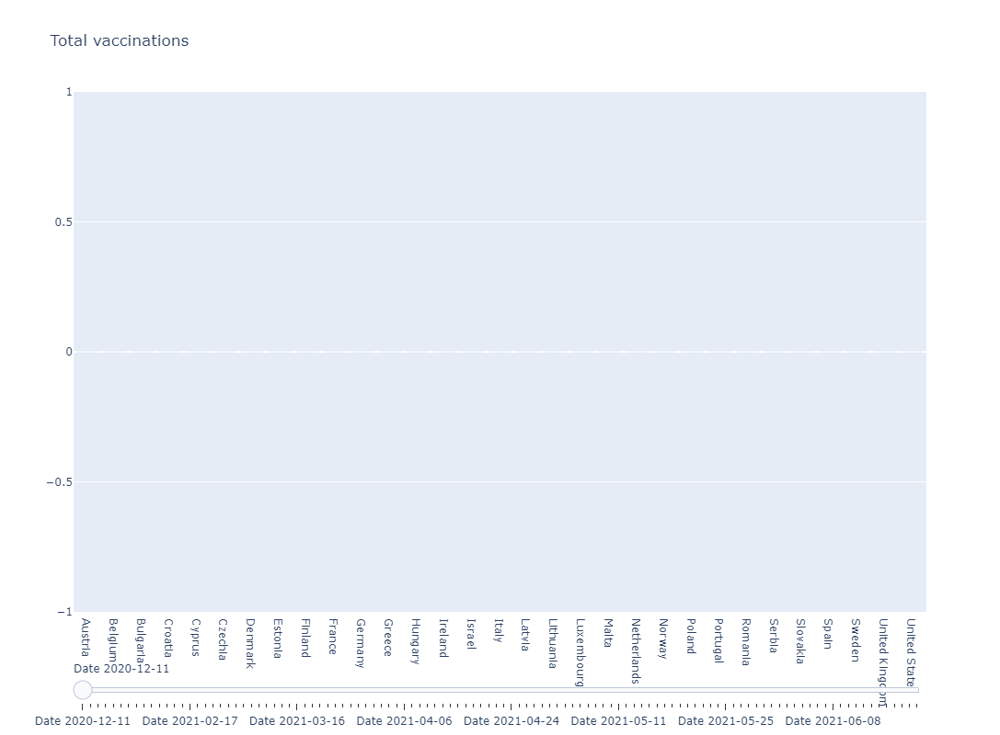

In [26]:
plot_vaccine_progress(country_vaccine_time, countries, 'Total vaccinations', 'Total vaccinations')

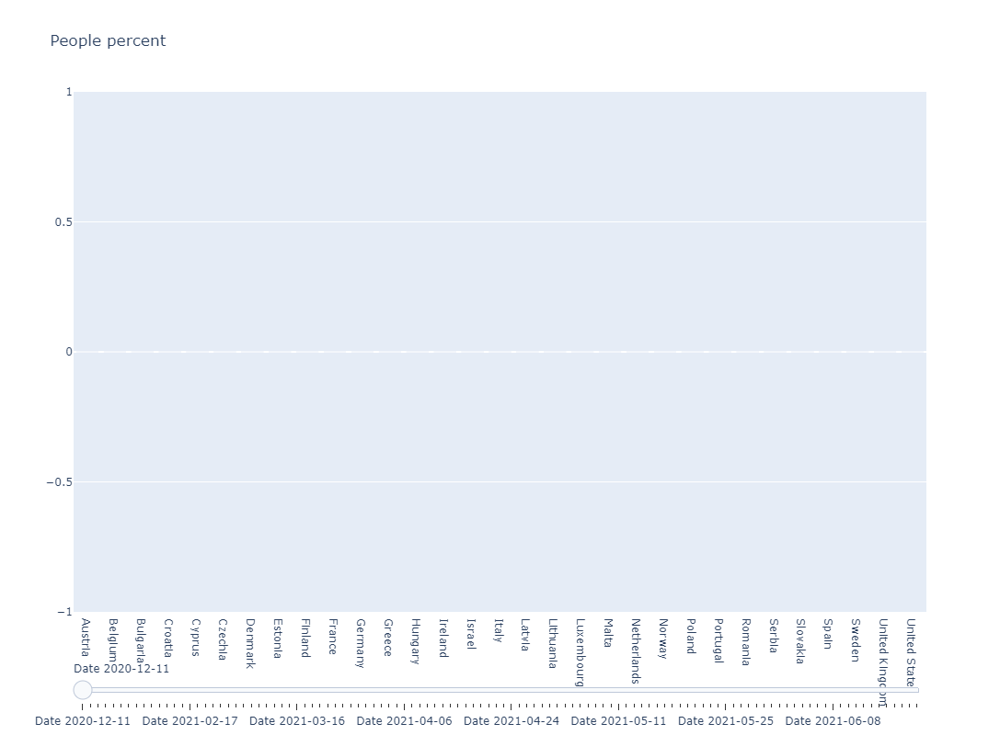

In [27]:
plot_vaccine_progress(country_vaccine_time, countries, 'People percent', 'People percent')

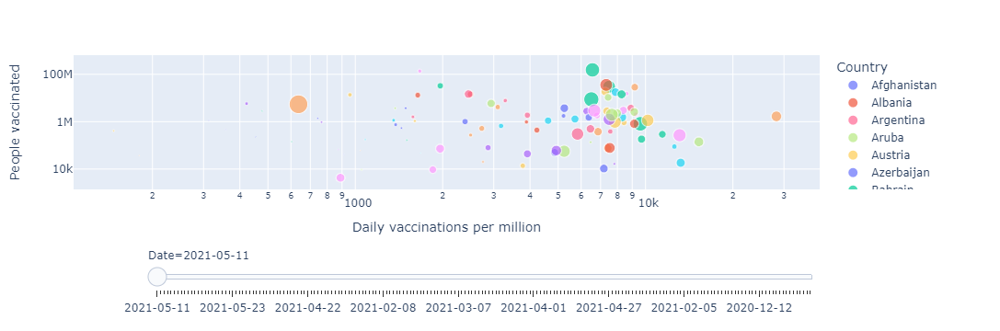

In [28]:
#https://plotly.com/python/sliders/
import plotly.express as px

df = country_vaccine_time
fig = px.scatter(df, x="Daily vaccinations per million", y="People vaccinated", animation_frame="Date", animation_group="Country",
           size="People fully vaccinated percent", color="Country", hover_name="Country",
           log_x=True, log_y=True)

fig["layout"].pop("updatemenus") # optional, drop animation buttons
fig.show()

In [29]:
new_country_vaccine = country_vaccine_time[country_vaccine_time['Country']=='United States'][['Date', 'Percent', 'Country']]

In [30]:
new_country_vaccine.head()

,Date,Percent,Country
24789,2021-01-14,3.33,United States
24790,2021-01-15,3.67,United States
24794,2021-01-19,4.70,United States
24795,2021-01-20,4.94,United States
24796,2021-01-21,5.25,United States


In [31]:
import datetime
date_sentiment = date_sentiment[(date_sentiment['date'] > datetime.date(year=2021,month=1,day=20)) & (date_sentiment['date'] < datetime.date(year=2021,month=3,day=16))]

In [32]:
new_country_vaccine['Date'] = pd.to_datetime(new_country_vaccine['Date']).dt.date

In [33]:
date_sentiment.head()

,date,sentiment,tweets
120,2021-01-21,negative,25
121,2021-01-21,neutral,42
122,2021-01-21,positive,78
123,2021-01-22,negative,11
124,2021-01-22,neutral,16


In [34]:
new_country_vaccine = new_country_vaccine[(new_country_vaccine['Date'] > datetime.date(year=2021,month=1,day=20)) & (new_country_vaccine['Date'] < datetime.date(year=2021,month=3,day=16))]

In [35]:
country_vaccine_time.columns

Index(['Country', 'Vaccines', 'Date', 'Total vaccinations', 'Percent',
       'People vaccinated', 'People percent', 'Daily vaccinations',
       'Daily vaccinations per million', 'People fully vaccinated',
       'People fully vaccinated percent'],
      dtype='object')

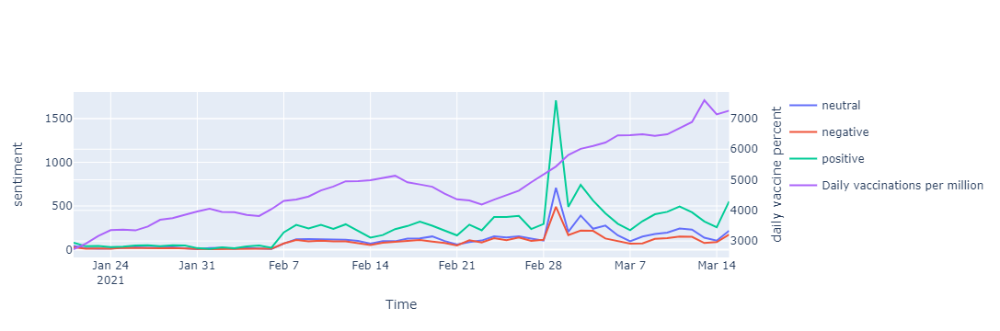

In [36]:
new_country_vaccine_daily_percent = country_vaccine_time[country_vaccine_time['Country']=='United States'][['Date', 'Daily vaccinations per million', 'Country']]
new_country_vaccine_daily_percent['Date'] = pd.to_datetime(new_country_vaccine_daily_percent['Date']).dt.date
new_country_vaccine_daily_percent = new_country_vaccine_daily_percent[(new_country_vaccine_daily_percent['Date'] > datetime.date(year=2021,month=1,day=20)) & (new_country_vaccine_daily_percent['Date'] < datetime.date(year=2021,month=3,day=16))]

subfig = make_subplots(specs=[[{"secondary_y": True}]])

fig = px.line(date_sentiment, x='date', y='tweets', color='sentiment', category_orders={'sentiment': ['neutral', 'negative', 'positive']},
             title='Timeline showing sentiment of tweets about COVID-19 vaccines')
fig2 = px.line(new_country_vaccine_daily_percent, x='Date', y=['Daily vaccinations per million'])
fig2.update_traces(yaxis="y2")

subfig.add_traces(fig.data + fig2.data)
subfig.layout.xaxis.title="Time"
subfig.layout.yaxis.title="sentiment"
subfig.layout.yaxis2.title="daily vaccine percent"
subfig.for_each_trace(lambda t: t.update(line=dict(color=t.marker.color)))
subfig.show()

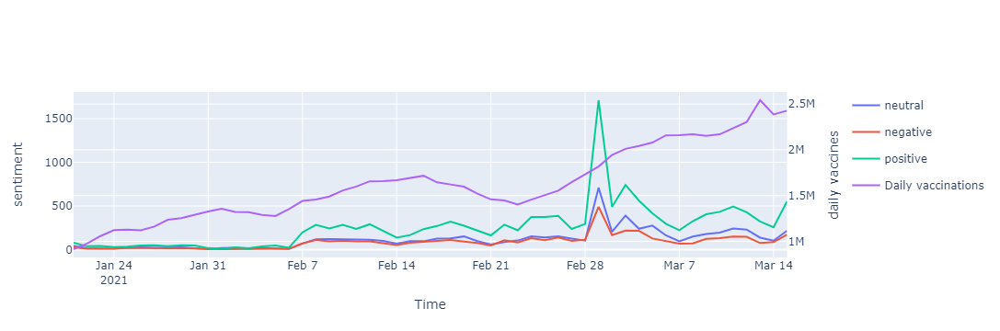

In [37]:
new_country_vaccine_daily = country_vaccine_time[country_vaccine_time['Country']=='United States'][['Date', 'Daily vaccinations', 'Country']]
new_country_vaccine_daily['Date'] = pd.to_datetime(new_country_vaccine_daily['Date']).dt.date
new_country_vaccine_daily = new_country_vaccine_daily[(new_country_vaccine_daily['Date'] > datetime.date(year=2021,month=1,day=20)) & (new_country_vaccine_daily['Date'] < datetime.date(year=2021,month=3,day=16))]

subfig = make_subplots(specs=[[{"secondary_y": True}]])
fig = px.line(date_sentiment, x='date', y='tweets', color='sentiment', category_orders={'sentiment': ['neutral', 'negative', 'positive']})
fig2 = px.line(new_country_vaccine_daily, x='Date', y=['Daily vaccinations'])

fig2.update_traces(yaxis="y2")

subfig.add_traces(fig.data + fig2.data)
subfig.layout.xaxis.title="Time"
subfig.layout.yaxis.title="sentiment"
subfig.layout.yaxis2.title="daily vaccines"
subfig.for_each_trace(lambda t: t.update(line=dict(color=t.marker.color)))
subfig.show()

In [38]:
processed_date_sentiment = date_sentiment.copy()
processed_sum_date_sentiment = processed_date_sentiment.groupby(['date']).agg({'tweets': 'sum'}).reset_index().dropna()
for index, row in processed_sum_date_sentiment.iterrows():
#     print(processed_date_sentiment.loc[(processed_date_sentiment['date']==row['date']) & (processed_date_sentiment['sentiment']=='positive')]['tweets'].values[0])
    processed_sum_date_sentiment.at[index,'proportion'] = (processed_date_sentiment.loc[(processed_date_sentiment['date']==row['date']) & (processed_date_sentiment['sentiment']=='positive')]['tweets'].values[0]) / processed_date_sentiment.loc[(processed_date_sentiment['date']==row['date']) & (processed_date_sentiment['sentiment']=='negative')]['tweets'].values[0]

In [39]:
processed_date_sentiment

,date,sentiment,tweets
120,2021-01-21,negative,25
121,2021-01-21,neutral,42
122,2021-01-21,positive,78
123,2021-01-22,negative,11
124,2021-01-22,neutral,16
...,...,...,...
277,2021-03-14,neutral,103
278,2021-03-14,positive,256
279,2021-03-15,negative,172
280,2021-03-15,neutral,216


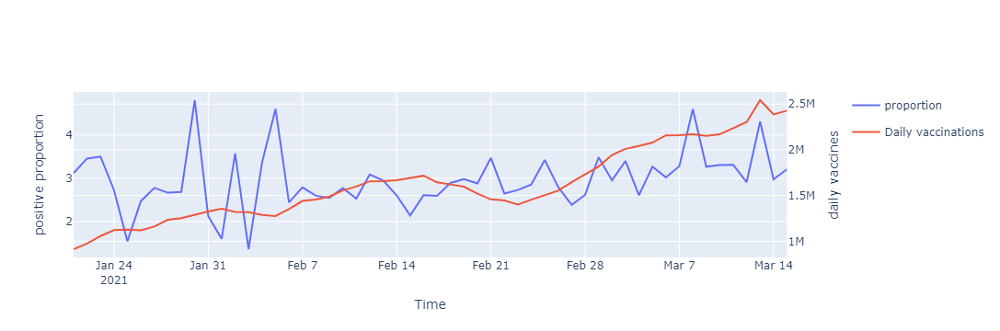

In [40]:
new_country_vaccine_daily = country_vaccine_time[country_vaccine_time['Country']=='United States'][['Date', 'Daily vaccinations', 'Country']]
new_country_vaccine_daily['Date'] = pd.to_datetime(new_country_vaccine_daily['Date']).dt.date
new_country_vaccine_daily = new_country_vaccine_daily[(new_country_vaccine_daily['Date'] > datetime.date(year=2021,month=1,day=20)) & (new_country_vaccine_daily['Date'] < datetime.date(year=2021,month=3,day=16))]

subfig = make_subplots(specs=[[{"secondary_y": True}]])
fig = px.line(processed_sum_date_sentiment, x='date', y=['proportion'])
fig2 = px.line(new_country_vaccine_daily, x='Date', y=['Daily vaccinations'])

fig2.update_traces(yaxis="y2")

subfig.add_traces(fig.data + fig2.data)
subfig.layout.xaxis.title="Time"
subfig.layout.yaxis.title="positive proportion"
subfig.layout.yaxis2.title="daily vaccines"
subfig.for_each_trace(lambda t: t.update(line=dict(color=t.marker.color)))
subfig.show()